In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
def generate_vortex_flow(size=224, strength=1.0, center=None):
    center = (size//2, size//2) if center is None else center
    x, y = np.meshgrid(np.arange(size) - center[0], np.arange(size) - center[1])
    r = np.sqrt(x**2 + y**2) + 1e-6
    u = -strength * y / r
    v = strength * x / r
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_sink_flow(size=224, strength=1.0, center=None):
    center = (size//2, size//2) if center is None else center
    x, y = np.meshgrid(np.arange(size) - center[0], np.arange(size) - center[1])
    r = np.sqrt(x**2 + y**2) + 1e-6
    u = -strength * x / r
    v = -strength * y / r
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_uniform_flow(size=224, angle=45):
    angle_rad = np.radians(angle)
    u = np.cos(angle_rad) * np.ones((size, size))
    v = np.sin(angle_rad) * np.ones((size, size))
    flow = np.stack([u, v], axis=-1)
    return flow

def generate_complex_flow(size=224):
    vortex1 = generate_vortex_flow(size, strength=1.0, center=(size//3, size//3))
    vortex2 = generate_vortex_flow(size, strength=-0.7, center=(2*size//3, 2*size//3))
    sink = generate_sink_flow(size, strength=1.0, center=(2*size//3, size//3))
    uniform = generate_uniform_flow(size, angle=30)
    flow = 0.4 * vortex1 + 0.3 * vortex2 + 0.2 * sink + 0.1 * uniform
    return flow

In [3]:
def plot_flow_field(flow, density=20, title="Flow Field"):
    plt.figure(figsize=(10, 10))
    
    colors = [(0, 0, 0.5), (0, 0.5, 1), (1, 1, 1), (1, 0.5, 0), (0.5, 0, 0)]
    cmap = LinearSegmentedColormap.from_list('flow_cmap', colors, N=100)
    
    u, v = flow[..., 0], flow[..., 1]
    magnitude = np.sqrt(u**2 + v**2)
    
    plt.imshow(magnitude, cmap=cmap, origin='lower')
    plt.colorbar(label='Velocity Magnitude')
    
    size = flow.shape[0]
    step = size // density
    y, x = np.mgrid[:size:step, :size:step]
    u_sub = u[::step, ::step]
    v_sub = v[::step, ::step]
    
    plt.quiver(x, y, u_sub, v_sub, 
               angles='xy', scale_units='xy', scale=0.1,
               color='black', width=0.003, 
               headwidth=4, headlength=5, headaxislength=3)
    
    plt.title(title)
    plt.tight_layout()
        
    plt.show()

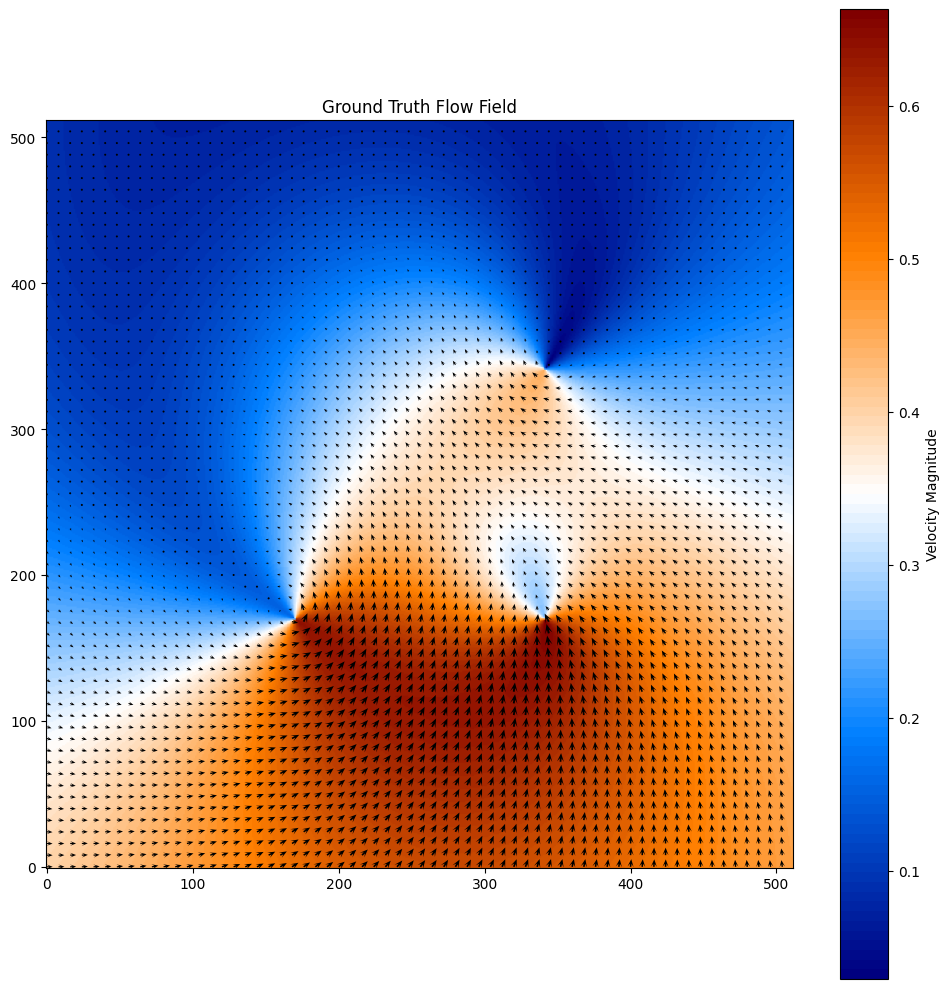

In [4]:
SIZE = 512
flow = generate_complex_flow(SIZE)
plot_flow_field(flow, SIZE // 8, "Ground Truth Flow Field")

In [5]:
class ODE(nn.Module):
	def __init__(self, input_dim, hidden_dims):
		super(ODE, self).__init__()
		dim_list = [input_dim] + list(hidden_dims) + [input_dim]
		layers = []
		for i in range(len(dim_list) - 1):
			layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
			if i < len(dim_list) - 2:
				layers.append(nn.ReLU())
		self.mlp = nn.Sequential(*layers)
	
	def forward(self, x):
		x = self.mlp(x)
		return x

In [6]:
def fit_flow_field(ode, flow_field, coordinates):
    optim = torch.optim.Adam(ode.parameters(), lr=1e-3, weight_decay=0)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optim, gamma=0.999)

    for epoch in range(10000):
        estimated_flow_field = ode(coordinates)

        loss = F.mse_loss(flow_field, estimated_flow_field)
        if epoch == 0 or (epoch < 1000 and (epoch + 1) % 100 == 0) or (epoch + 1) % 1000 == 0:
            print(f'Epoch {epoch+1}, Loss: {loss}')

        optim.zero_grad()
        loss.backward()
        optim.step()
        scheduler.step()

    return estimated_flow_field

In [7]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [8]:
y_coords = torch.arange(SIZE).view(1, SIZE, 1).expand(SIZE, SIZE, 1)
x_coords = torch.arange(SIZE).view(SIZE, 1, 1).expand(SIZE, SIZE, 1)
coordinate_tensor = torch.cat([x_coords, y_coords], dim=2)
coordinate_tensor = coordinate_tensor.float()
coordinate_tensor = coordinate_tensor.to(device)

In [9]:
flow_tensor = torch.FloatTensor(flow)
flow_tensor = flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_flow_tensor = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 45.454124450683594
Epoch 100, Loss: 0.04041260853409767
Epoch 200, Loss: 0.02889568731188774
Epoch 300, Loss: 0.01868630200624466
Epoch 400, Loss: 0.020610790699720383
Epoch 500, Loss: 0.014784067869186401
Epoch 600, Loss: 0.01400722749531269
Epoch 700, Loss: 0.013206634670495987
Epoch 800, Loss: 0.011637522839009762
Epoch 900, Loss: 0.010258153080940247
Epoch 1000, Loss: 0.008740211836993694
Epoch 2000, Loss: 0.005952071398496628
Epoch 3000, Loss: 0.00520355673506856
Epoch 4000, Loss: 0.0048393625766038895
Epoch 5000, Loss: 0.00463726744055748
Epoch 6000, Loss: 0.004539920948445797
Epoch 7000, Loss: 0.004493900574743748
Epoch 8000, Loss: 0.004472130909562111
Epoch 9000, Loss: 0.004461778327822685
Epoch 10000, Loss: 0.004457059781998396


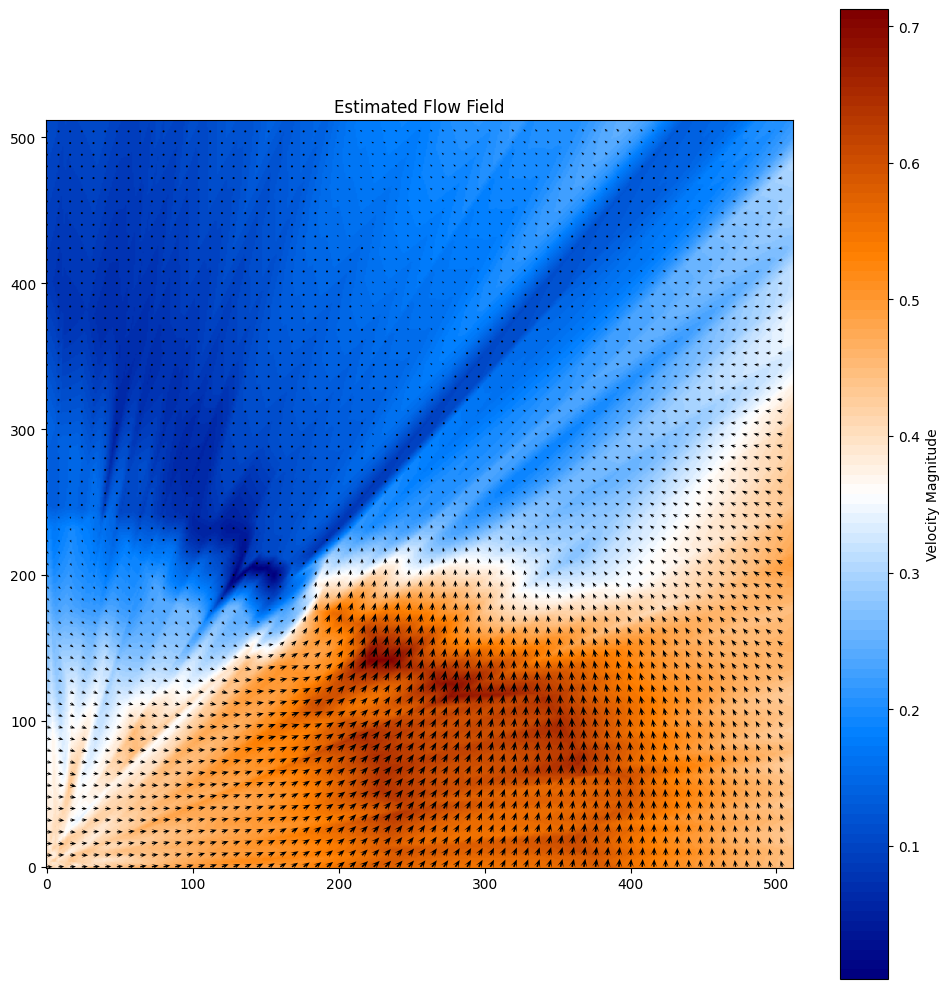

In [10]:
estimated_flow = estimated_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_flow, SIZE // 8, "Estimated Flow Field")

In [11]:
class FourierFeatureODE(nn.Module):
    def __init__(self, input_dim, hidden_dims, fourier_scale=10.0, num_fourier_features=10, random_features=False):
        super(FourierFeatureODE, self).__init__()
        
        self.input_dim = input_dim
        self.num_fourier_features = num_fourier_features
        
        self.random_features = random_features
        self.register_buffer('B', torch.randn(input_dim, num_fourier_features) * fourier_scale)
        
        fourier_expanded_dim = input_dim + 2 * num_fourier_features
        dim_list = [fourier_expanded_dim] + list(hidden_dims) + [input_dim]
        layers = []
        for i in range(len(dim_list) - 1):
            layers.append(nn.Linear(dim_list[i], dim_list[i + 1]))
            if i < len(dim_list) - 2:
                layers.append(nn.ReLU())
        self.mlp = nn.Sequential(*layers)
    
    # Fourier Features Let Networks Learn High Frequency Functions in Low Dimensional Domains style
    def compute_random_fourier_features(self, x):
        x_proj = torch.matmul(x, self.B)
        sin_features = torch.sin(2 * np.pi * x_proj)
        cos_features = torch.cos(2 * np.pi * x_proj)
        fourier_features = torch.cat([x, sin_features, cos_features], dim=-1)
        return fourier_features
    
    # NeRF/Transformer style
    def compute_positional_fourier_features(self, x):
        encodings = [x]
        for i in range(self.num_fourier_features // 2):
            freq = 2.0 ** i
            sin_features = torch.sin(freq * x)
            cos_features = torch.cos(freq * x)
            encodings.append(sin_features)
            encodings.append(cos_features)
        return torch.cat(encodings, dim=-1)

    def forward(self, x):
        x_fourier = self.compute_random_fourier_features(x) if self.random_features else self.compute_positional_fourier_features(x)
        output = self.mlp(x_fourier)
        return output

In [12]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_flow_tensor_ff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.8137650489807129
Epoch 100, Loss: 0.007062217220664024
Epoch 200, Loss: 0.002552694408223033
Epoch 300, Loss: 0.0010421156184747815
Epoch 400, Loss: 0.0007628538878634572
Epoch 500, Loss: 0.0006059356965124607
Epoch 600, Loss: 0.00047584593994542956
Epoch 700, Loss: 0.0003951989929191768
Epoch 800, Loss: 0.0003402323345653713
Epoch 900, Loss: 0.00030346494168043137
Epoch 1000, Loss: 0.00027445313753560185
Epoch 2000, Loss: 0.00015001732390373945
Epoch 3000, Loss: 0.00011495753278722987
Epoch 4000, Loss: 0.00010022282367572188
Epoch 5000, Loss: 9.30720561882481e-05
Epoch 6000, Loss: 8.94106924533844e-05
Epoch 7000, Loss: 8.753821020945907e-05
Epoch 8000, Loss: 8.661152969580144e-05
Epoch 9000, Loss: 8.6171567090787e-05
Epoch 10000, Loss: 8.597275882493705e-05


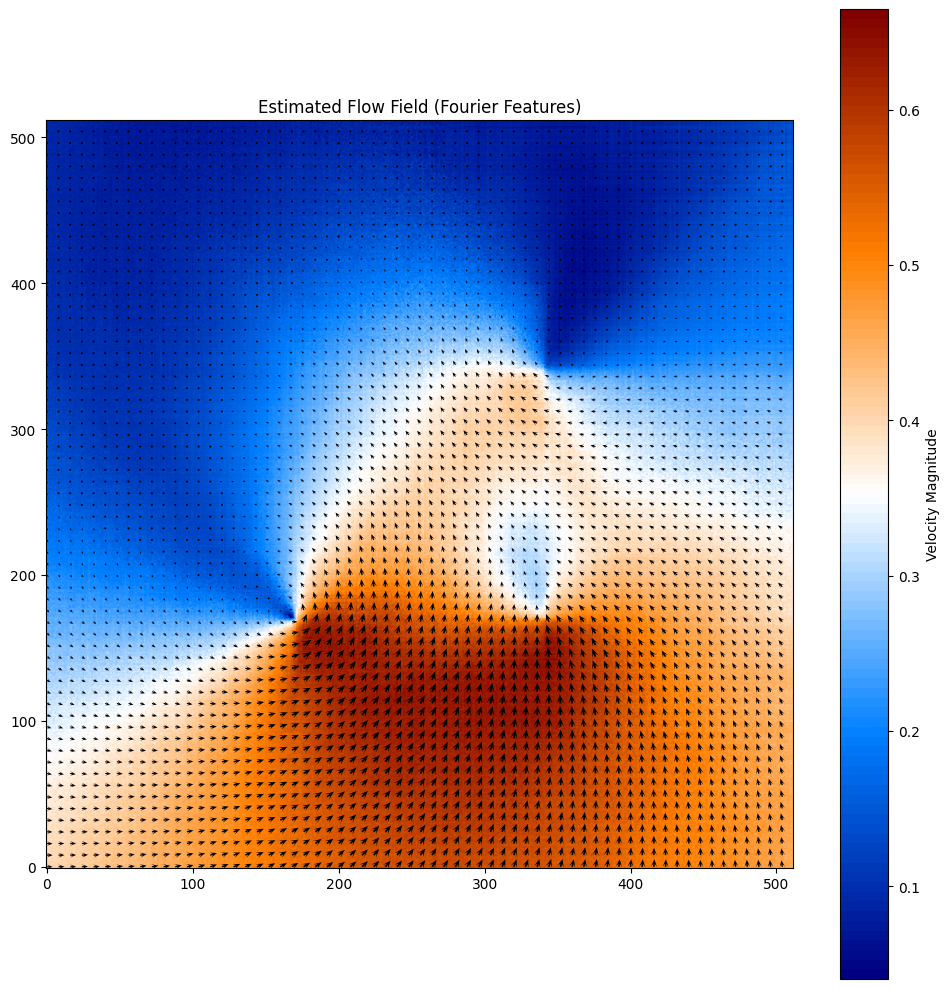

In [13]:
estimated_flow_ff = estimated_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_flow_ff, SIZE // 8, "Estimated Flow Field (Fourier Features)")

In [14]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126, random_features=True).to(device)
estimated_flow_tensor_rff = fit_flow_field(ode, flow_tensor, coordinate_tensor)

Epoch 1, Loss: 2.3336267471313477
Epoch 100, Loss: 0.009207742288708687
Epoch 200, Loss: 0.0036535048857331276
Epoch 300, Loss: 0.0027785087004303932
Epoch 400, Loss: 0.0020476484205573797
Epoch 500, Loss: 0.001822468126192689
Epoch 600, Loss: 0.001527511514723301
Epoch 700, Loss: 0.001290113665163517
Epoch 800, Loss: 0.001156225218437612
Epoch 900, Loss: 0.0010015094885602593
Epoch 1000, Loss: 0.0009040096774697304
Epoch 2000, Loss: 0.00048758587217889726
Epoch 3000, Loss: 0.00036888616159558296
Epoch 4000, Loss: 0.00032003119122236967
Epoch 5000, Loss: 0.00029683695174753666
Epoch 6000, Loss: 0.0002851707977242768
Epoch 7000, Loss: 0.00027942826272919774
Epoch 8000, Loss: 0.00027669587871059775
Epoch 9000, Loss: 0.00027544971089810133
Epoch 10000, Loss: 0.0002748982224147767


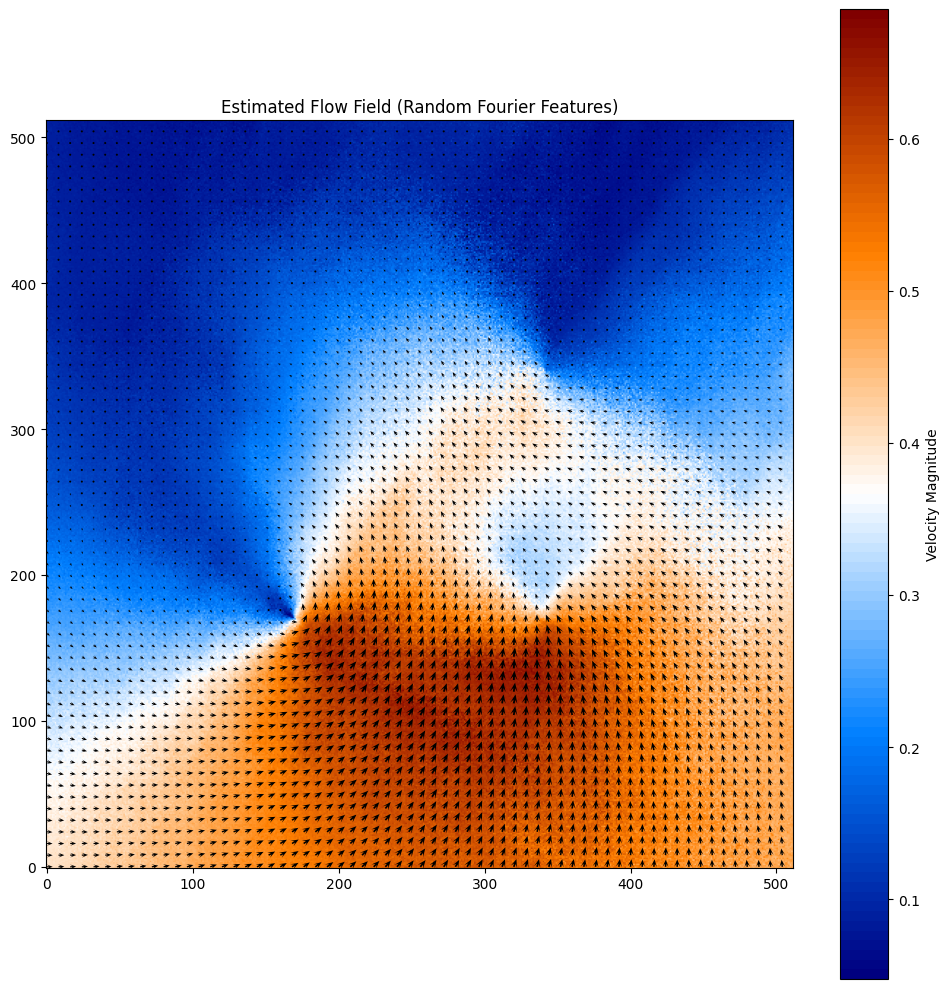

In [15]:
estimated_flow_rff = estimated_flow_tensor_rff.detach().cpu().numpy()
plot_flow_field(estimated_flow_rff, SIZE // 8, "Estimated Flow Field (Random Fourier Features)")

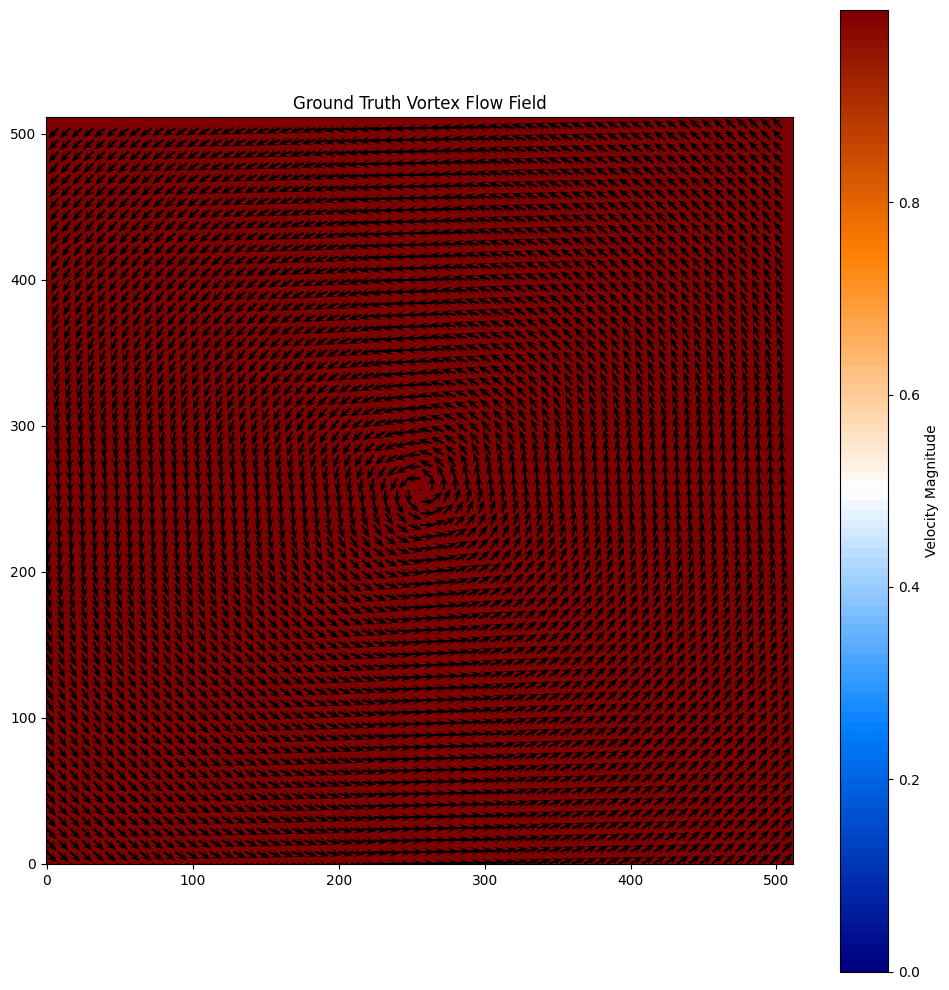

In [16]:
vortex_flow = generate_vortex_flow(SIZE)
plot_flow_field(vortex_flow, SIZE // 8, "Ground Truth Vortex Flow Field")

In [17]:
vortex_flow_tensor = torch.FloatTensor(vortex_flow)
vortex_flow_tensor = vortex_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_vortex_flow_tensor = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 41.010353088378906
Epoch 100, Loss: 0.1895992010831833
Epoch 200, Loss: 0.15342311561107635
Epoch 300, Loss: 0.07633436471223831
Epoch 400, Loss: 0.056650906801223755
Epoch 500, Loss: 0.036668047308921814
Epoch 600, Loss: 0.03387245535850525
Epoch 700, Loss: 0.03175598755478859
Epoch 800, Loss: 0.025576390326023102
Epoch 900, Loss: 0.023252256214618683
Epoch 1000, Loss: 0.02160010114312172
Epoch 2000, Loss: 0.011546630412340164
Epoch 3000, Loss: 0.008577343076467514
Epoch 4000, Loss: 0.007507285103201866
Epoch 5000, Loss: 0.0069776494055986404
Epoch 6000, Loss: 0.006704812869429588
Epoch 7000, Loss: 0.006568388547748327
Epoch 8000, Loss: 0.006503411568701267
Epoch 9000, Loss: 0.006473495624959469
Epoch 10000, Loss: 0.006459982134401798


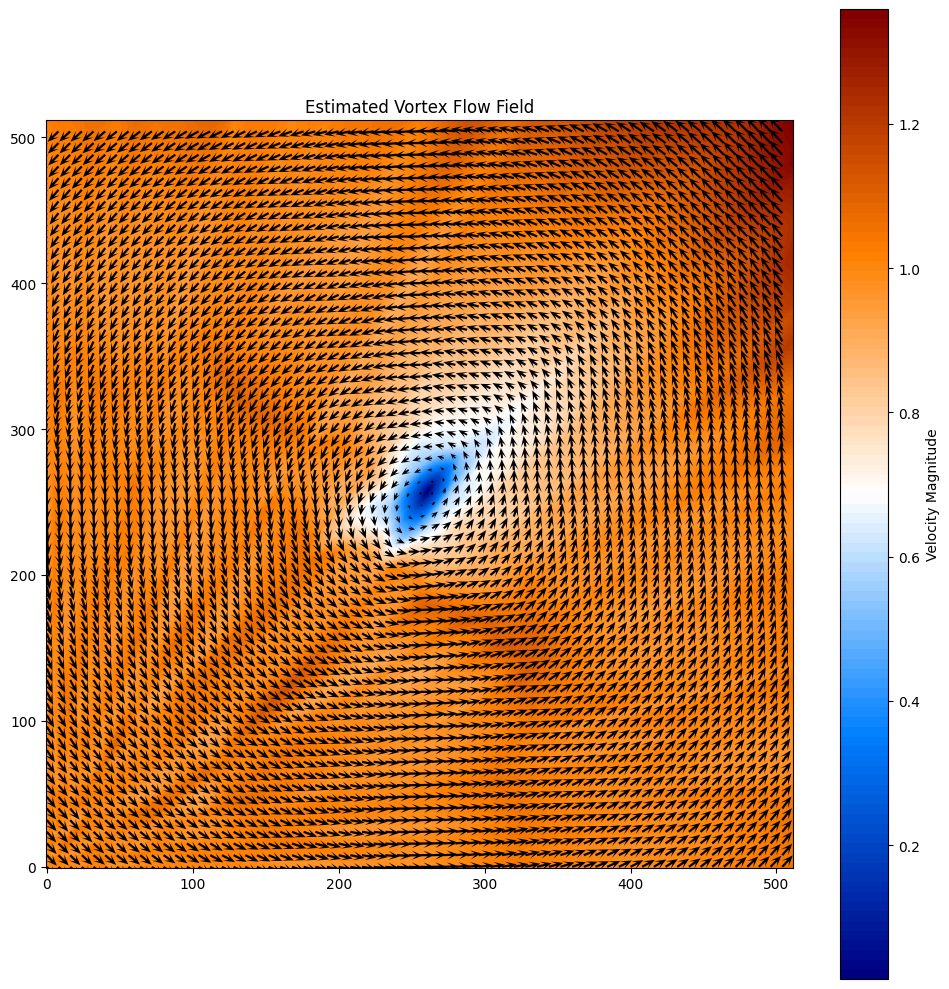

In [18]:
estimated_vortex_flow = estimated_vortex_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow, SIZE // 8, "Estimated Vortex Flow Field")

In [19]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_vortex_flow_tensor_ff = fit_flow_field(ode, vortex_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.6541244983673096
Epoch 100, Loss: 0.027978770434856415
Epoch 200, Loss: 0.009859226644039154
Epoch 300, Loss: 0.00553747545927763
Epoch 400, Loss: 0.003596645314246416
Epoch 500, Loss: 0.0021075678523629904
Epoch 600, Loss: 0.0015608447138220072
Epoch 700, Loss: 0.0013306090841069818
Epoch 800, Loss: 0.001098679262213409
Epoch 900, Loss: 0.0009735121857374907
Epoch 1000, Loss: 0.0008731350535526872
Epoch 2000, Loss: 0.0004960144869983196
Epoch 3000, Loss: 0.0003878185525536537
Epoch 4000, Loss: 0.00034065527142956853
Epoch 5000, Loss: 0.00031735250377096236
Epoch 6000, Loss: 0.000305206049233675
Epoch 7000, Loss: 0.00029893554165028036
Epoch 8000, Loss: 0.0002958046388812363
Epoch 9000, Loss: 0.0002943260478787124
Epoch 10000, Loss: 0.00029365887166932225


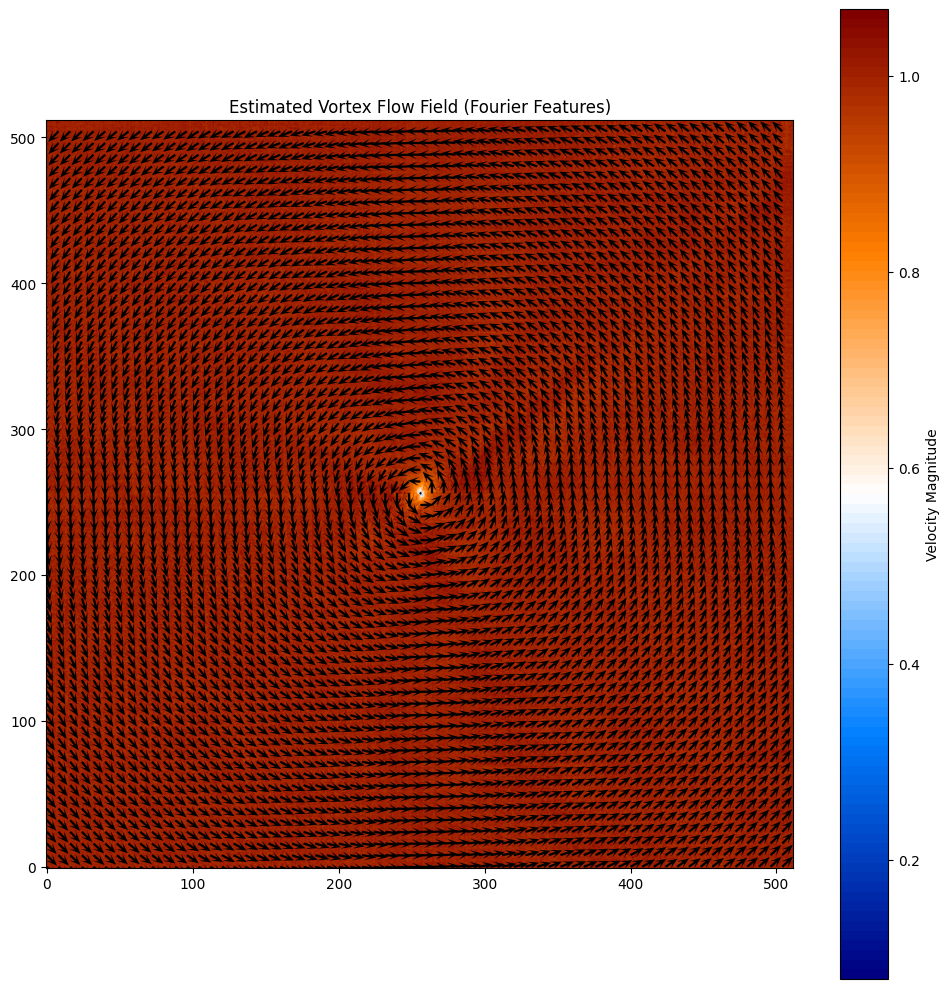

In [20]:
estimated_vortex_flow_ff = estimated_vortex_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_vortex_flow_ff, SIZE // 8, "Estimated Vortex Flow Field (Fourier Features)")

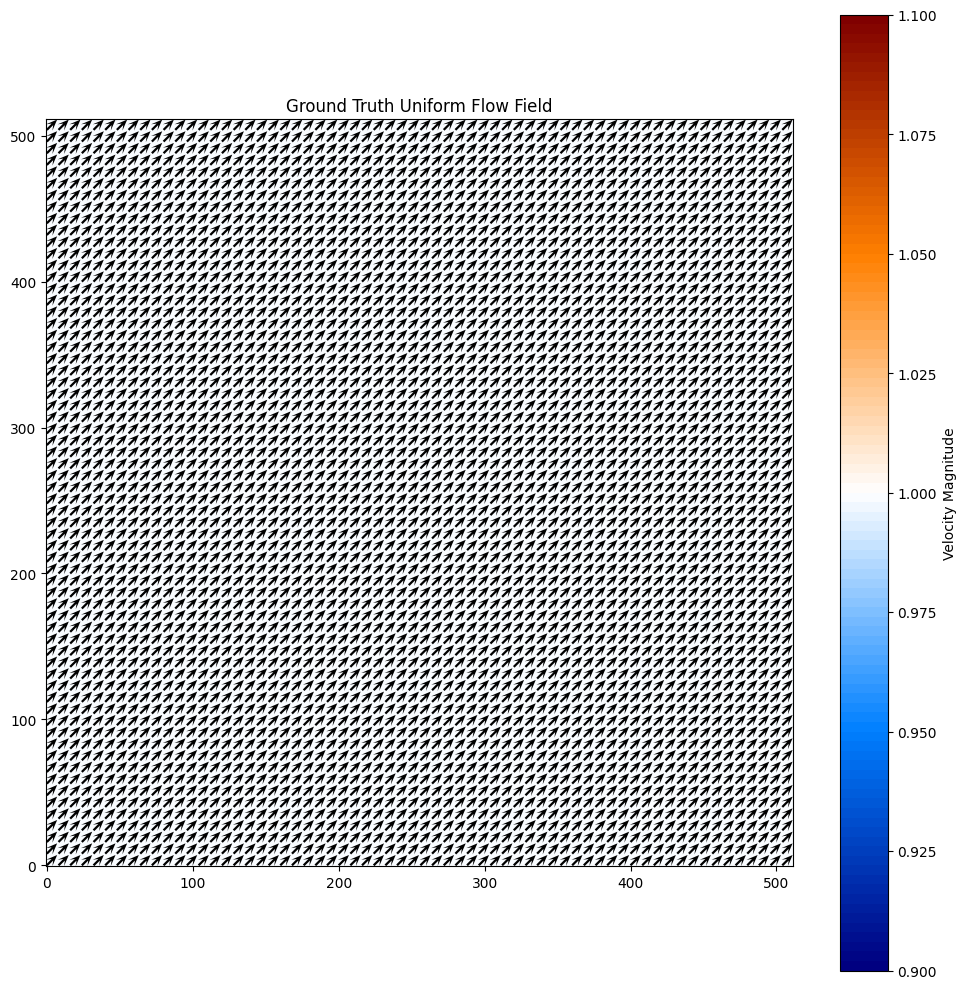

In [21]:
uniform_flow = generate_uniform_flow(SIZE)
plot_flow_field(uniform_flow, SIZE // 8, "Ground Truth Uniform Flow Field")

In [22]:
uniform_flow_tensor = torch.FloatTensor(uniform_flow)
uniform_flow_tensor = uniform_flow_tensor.to(device)
ode = ODE(2, (256 for _ in range(3))).to(device)
estimated_uniform_flow_tensor = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 183.78253173828125
Epoch 100, Loss: 0.05978509411215782
Epoch 200, Loss: 0.03995685651898384
Epoch 300, Loss: 0.009697739034891129
Epoch 400, Loss: 0.0013098999625071883
Epoch 500, Loss: 0.0007989467703737319
Epoch 600, Loss: 0.000393945025280118
Epoch 700, Loss: 0.0002679912722669542
Epoch 800, Loss: 0.00022325851023197174
Epoch 900, Loss: 0.00019135448383167386
Epoch 1000, Loss: 0.0001704486203379929
Epoch 2000, Loss: 9.715867054183036e-05
Epoch 3000, Loss: 7.601017568958923e-05
Epoch 4000, Loss: 6.9268855440896e-05
Epoch 5000, Loss: 6.598315667361021e-05
Epoch 6000, Loss: 6.42579689156264e-05
Epoch 7000, Loss: 6.33678282611072e-05
Epoch 8000, Loss: 6.292328907875344e-05
Epoch 9000, Loss: 6.271121674217284e-05
Epoch 10000, Loss: 6.261160160647705e-05


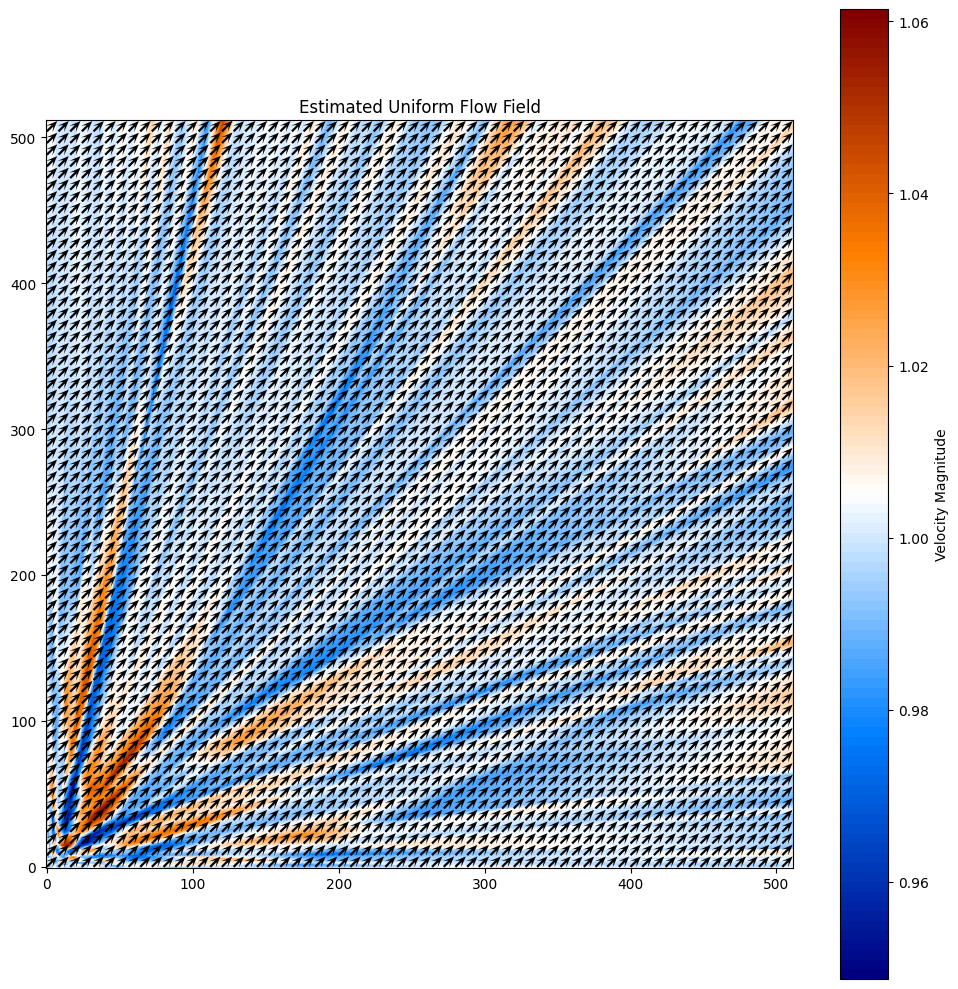

In [23]:
estimated_uniform_flow = estimated_uniform_flow_tensor.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow, SIZE // 8, "Estimated Uniform Flow Field")

In [24]:
ode = FourierFeatureODE(2, (256 for _ in range(3)), num_fourier_features=126).to(device)
estimated_uniform_flow_tensor_ff = fit_flow_field(ode, uniform_flow_tensor, coordinate_tensor)

Epoch 1, Loss: 0.15272027254104614
Epoch 100, Loss: 0.0015828197356313467
Epoch 200, Loss: 0.0007118490757420659
Epoch 300, Loss: 0.0004351907118689269
Epoch 400, Loss: 0.00032178216497413814
Epoch 500, Loss: 0.0002646122593432665
Epoch 600, Loss: 0.00022999198699835688
Epoch 700, Loss: 0.00020053749904036522
Epoch 800, Loss: 0.00018194377480540425
Epoch 900, Loss: 0.0001673632941674441
Epoch 1000, Loss: 0.00015543962945230305
Epoch 2000, Loss: 9.393483924213797e-05
Epoch 3000, Loss: 7.114457548595965e-05
Epoch 4000, Loss: 6.0904956626472995e-05
Epoch 5000, Loss: 5.575789691647515e-05
Epoch 6000, Loss: 5.306750244926661e-05
Epoch 7000, Loss: 5.166545452084392e-05
Epoch 8000, Loss: 5.095826054457575e-05
Epoch 9000, Loss: 5.061894626123831e-05
Epoch 10000, Loss: 5.046525984653272e-05


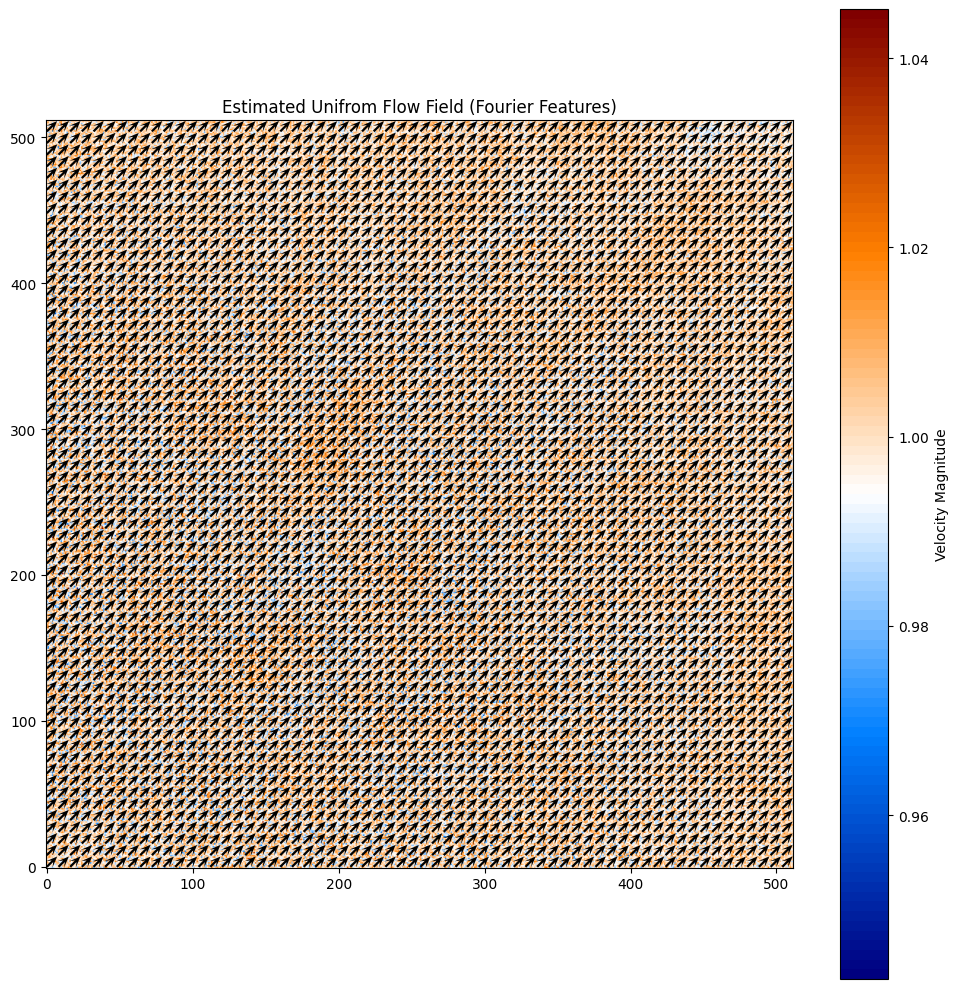

In [25]:
estimated_uniform_flow_ff = estimated_uniform_flow_tensor_ff.detach().cpu().numpy()
plot_flow_field(estimated_uniform_flow_ff, SIZE // 8, "Estimated Unifrom Flow Field (Fourier Features)")